Run this code after you have created the block level voting data, see README for details.

In [17]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import math

In [18]:
block_votes = gpd.read_file('Data/BlockVotes/census_blocks_with_votes.shp')
block_votes

,STATEFP20,COUNTYFP20,TRACTCE20,BLOCKCE20,GEOID20,GEOIDFQ20,NAME20,MTFCC20,UR20,UACE20,...,INTPTLAT20,INTPTLON20,HOUSING20,POP20,precinct_i,rep_pct,dem_pct,RepVoters,DemVoters,geometry
0,12,091,020102,2035,120910201022035,1000000US120910201022035,Block2035,G5040,R,None,...,+30.8061445,-086.6775383,18,49,1037,0.888667,0.111333,44,5,"POLYGON ((-86.6807 30.80074, -86.68067 30.8008..."
1,12,091,021502,2018,120910215022018,1000000US120910215022018,Block2018,G5040,U,61372,...,+30.4465292,-086.5742819,8,19,1052,0.695979,0.304021,13,6,"POLYGON ((-86.57468 30.44711, -86.57385 30.447..."
2,12,091,021501,2005,120910215012005,1000000US120910215012005,Block2005,G5040,U,61372,...,+30.4422689,-086.5772939,0,0,1052,0.695979,0.304021,0,0,"POLYGON ((-86.57811 30.44255, -86.57726 30.442..."
3,12,091,020303,1034,120910203031034,1000000US120910203031034,Block1034,G5040,U,21043,...,+30.7974209,-086.5443412,19,55,1087,0.785246,0.214754,43,12,"POLYGON ((-86.54481 30.79866, -86.5448 30.7989..."
4,12,091,023100,1010,120910231001010,1000000US120910231001010,Block1010,G5040,U,61372,...,+30.4125455,-086.7281819,31,54,1070,0.665773,0.334227,36,18,"POLYGON ((-86.7286 30.41309, -86.72773 30.4130..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317289,12,081,002024,1016,120810020241016,1000000US120810020241016,Block1016,G5040,U,09536,...,+27.5187484,-082.4947687,125,270,926,0.674157,0.325843,182,88,"POLYGON ((-82.49813 27.52009, -82.49812 27.520..."
317290,12,081,001404,2007,120810014042007,1000000US120810014042007,Block2007,G5040,U,09536,...,+27.5500365,-082.5630562,1,6,921,0.609424,0.390576,4,2,"POLYGON ((-82.56463 27.54363, -82.56463 27.543..."
317291,12,081,001501,1021,120810015011021,1000000US120810015011021,Block1021,G5040,U,09536,...,+27.5325899,-082.5612507,3,11,936,0.175879,0.824121,2,9,"POLYGON ((-82.56156 27.53312, -82.56133 27.533..."
317292,12,081,001907,1015,120810019071015,1000000US120810019071015,Block1015,G5040,U,09536,...,+27.5300199,-082.4892644,0,0,925,0.640415,0.359585,0,0,"POLYGON ((-82.49874 27.53149, -82.49869 27.531..."


Add the census blocks randomly to 28 districts

In [19]:
block_votes['district'] = -1

total_pop = block_votes['POP20'].sum()
district_size = total_pop/28
lower_bound = district_size*0.9
upper_bound = district_size*1.1

working_df = block_votes.copy().reset_index(drop=False)

# Sorting by largest blocks first
working_df = working_df.sort_values(by='POP20', ascending=False).reset_index(drop=True)

# Create 28 district population count lists
district_pops = [0] * 28

for idx, row in working_df.iterrows():
    block_pop = row['POP20']
       
    # Add block to district with lowest population
    target_district = np.argmin(district_pops)
    working_df.loc[idx, 'district'] = target_district
    district_pops[target_district] += block_pop
    print(f"Index = {idx}, District = {target_district}, Population = {district_pops[target_district]}")

for idx, row in working_df.iterrows():
    original_idx = row['index']  # Get the original index value
    block_votes.loc[original_idx, 'district'] = row['district']

district_summary = block_votes.groupby('district')['POP20'].sum().reset_index()
district_summary['population_percentage'] = (district_summary['POP20'] / total_pop) * 100
district_summary['deviation_from_target'] = ((district_summary['POP20'] - district_size) / district_size) * 100
district_summary

Index = 0, District = 0, Population = 6107
Index = 1, District = 1, Population = 4475
Index = 2, District = 2, Population = 4011
Index = 3, District = 3, Population = 3904
Index = 4, District = 4, Population = 3357
Index = 5, District = 5, Population = 3060
Index = 6, District = 6, Population = 2954
Index = 7, District = 7, Population = 2928
Index = 8, District = 8, Population = 2911
Index = 9, District = 9, Population = 2899
Index = 10, District = 10, Population = 2841
Index = 11, District = 11, Population = 2823
Index = 12, District = 12, Population = 2822
Index = 13, District = 13, Population = 2797
Index = 14, District = 14, Population = 2795
Index = 15, District = 15, Population = 2748
Index = 16, District = 16, Population = 2745
Index = 17, District = 17, Population = 2743
Index = 18, District = 18, Population = 2702
Index = 19, District = 19, Population = 2679
Index = 20, District = 20, Population = 2669
Index = 21, District = 21, Population = 2660
Index = 22, District = 22, Pop

,district,POP20,population_percentage,deviation_from_target
0,0,590861,3.571429,0.000006
1,1,590861,3.571429,0.000006
2,2,590861,3.571429,0.000006
3,3,590861,3.571429,0.000006
4,4,590861,3.571429,0.000006
5,5,590861,3.571429,0.000006
6,6,590861,3.571429,0.000006
7,7,590861,3.571429,0.000006
8,8,590861,3.571429,0.000006
9,9,590861,3.571429,0.000006


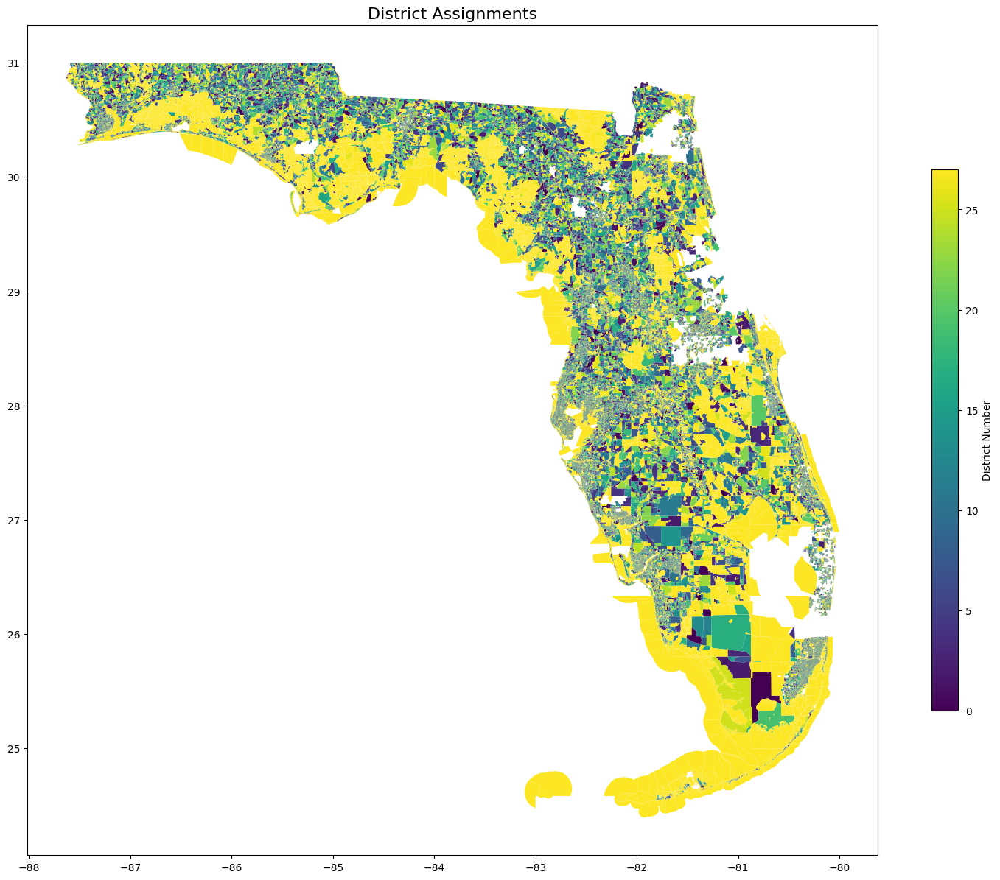

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(15,15))
    
# Plot the geodataframe
block_votes.plot(
    column='district', 
    ax=ax,
    legend=True,
    legend_kwds={
        'label': "District Number",
        'orientation': "vertical",
        'shrink': 0.5,
        }
)
    
# Add title
ax.set_title("District Assignments", fontsize=16)
plt.tight_layout()

In [21]:
columns = ['ALAND20', 'AWATER20', 'HOUSING20', 'POP20', 'RepVoters', 'DemVoters']
    
# Create an aggregation dictionary for the specified columns
agg_dict = {col: 'sum' for col in columns if col in block_votes.columns}

district_map = block_votes.dissolve(
        by='district',
        aggfunc=agg_dict,
        as_index=True
    )
district_map = district_map.reset_index()

In [22]:
district_map

,district,geometry,ALAND20,AWATER20,HOUSING20,POP20,RepVoters,DemVoters
0,0,"MULTIPOLYGON (((-87.49818 30.31482, -87.49817 ...",3650487274,52463558,272622,590861,343180,247680
1,1,"MULTIPOLYGON (((-87.51344 30.28263, -87.51327 ...",2788716383,70283864,273630,590861,340784,250082
2,2,"MULTIPOLYGON (((-87.44162 30.31538, -87.44155 ...",3570015679,65907283,273657,590861,337177,253685
3,3,"MULTIPOLYGON (((-87.44209 30.32068, -87.44209 ...",3144745613,32666875,272587,590861,336244,254607
4,4,"MULTIPOLYGON (((-87.4876 30.2875, -87.48515 30...",3111453160,47494460,274476,590861,339228,251633
5,5,"MULTIPOLYGON (((-87.43333 30.31648, -87.43317 ...",2686104925,47445554,268947,590861,335949,254910
6,6,"MULTIPOLYGON (((-87.49169 30.3189, -87.49164 3...",2939406311,44400571,276780,590861,335575,255289
7,7,"MULTIPOLYGON (((-87.43992 30.31813, -87.43985 ...",3220801368,49601960,274261,590861,336889,253982
8,8,"MULTIPOLYGON (((-87.5097 30.28477, -87.50971 3...",3105565007,42466638,272797,590861,341118,249739
9,9,"MULTIPOLYGON (((-87.42893 30.31576, -87.42872 ...",2883372378,48154633,280491,590861,336291,254566


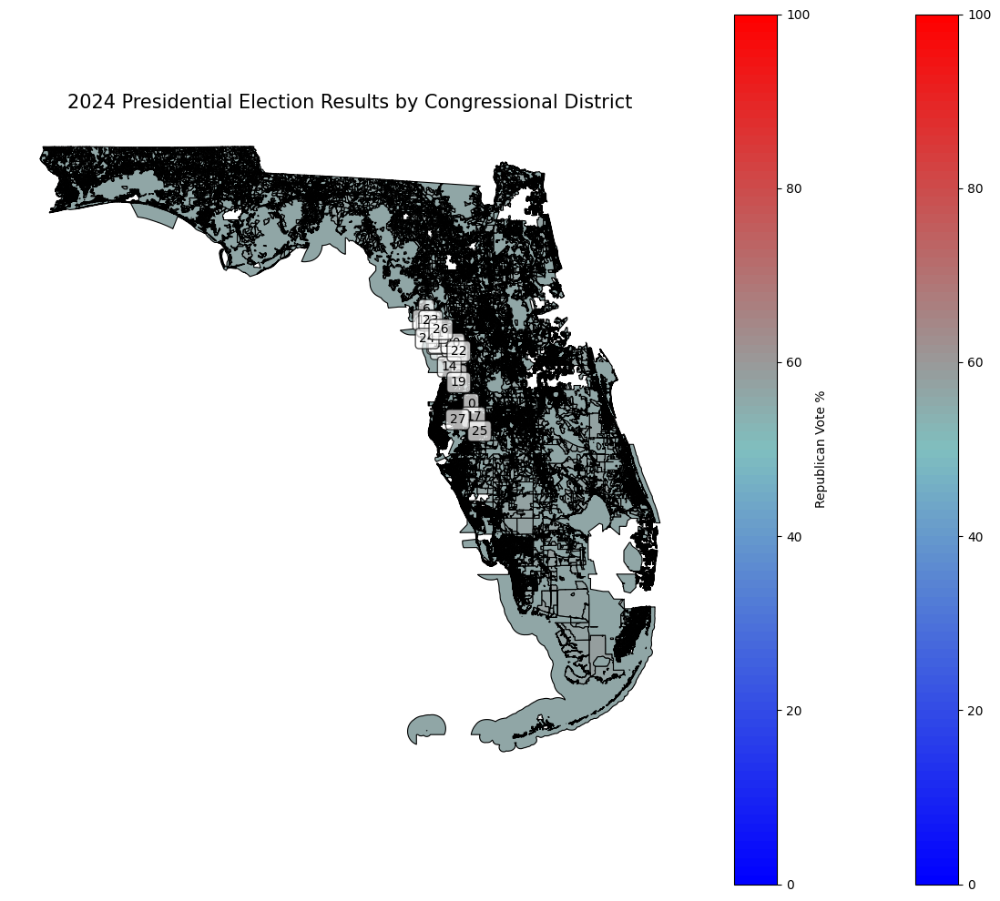

Congressional District Results:
    district  RepVoters  DemVoters   POP20    rep_pct    dem_pct     margin
0          0     343180     247680  590861  58.081342  41.918488  16.162854
1          1     340784     250082  590861  57.675832  42.325014  15.350819
2          2     337177     253685  590861  57.065367  42.934802  14.130565
3          3     336244     254607  590861  56.907462  43.090845  13.816617
4          4     339228     251633  590861  57.412488  42.587512  14.824976
5          5     335949     254910  590861  56.857535  43.142126  13.715409
6          6     335575     255289  590861  56.794238  43.206270  13.587967
7          7     336889     253982  590861  57.016625  42.985068  14.031557
8          8     341118     249739  590861  57.732360  42.266963  15.465397
9          9     336291     254566  590861  56.915417  43.083906  13.831510
10        10     339770     251100  590861  57.504218  42.497305  15.006914
11        11     338189     252668  590861  57.236643  4

In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

district_map['RepVoters'] = district_map['RepVoters'].fillna(0)
district_map['DemVoters'] = district_map['DemVoters'].fillna(0)

# Handle potential division by zero
district_map['rep_pct'] = np.where(
    district_map['POP20'] > 0,
    district_map['RepVoters'] / district_map['POP20'] * 100,
    50  # Default to 50% if no votes
)

district_map['dem_pct'] = np.where(
    district_map['POP20'] > 0,
    district_map['DemVoters'] / district_map['POP20'] * 100,
    50  # Default to 50% if no votes
)

district_map['margin'] = district_map['rep_pct'] - district_map['dem_pct']

colors = [(0, 0, 1), (0.5, 0.75, 0.75), (1, 0, 0)]  # Blue -> Light Purple -> Red
cmap_name = 'election'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=100)

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

district_map.plot(
    column='rep_pct',
    cmap=cm,
    linewidth=0.8,
    ax=ax,
    edgecolor='black',
    legend=True,
    vmin=0,
    vmax=100
)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Republican Vote %')

# Add labels
for idx, row in district_map.iterrows():
    # Get the centroid of the district
    centroid = row.geometry.centroid
    ax.text(
        centroid.x, centroid.y, 
        str(row['district']),  
        fontsize=10,
        ha='center', va='center',
        color='black',
        bbox=dict(facecolor='white', alpha=0.7, boxstyle="round,pad=0.3")
    )

plt.title('2024 Presidential Election Results by Congressional District', fontsize=15)
plt.axis('off')
plt.tight_layout()
plt.savefig('Data/new_district_election_results_map.png', dpi=300, bbox_inches='tight')
plt.show()

print("Congressional District Results:")
summary_table = district_map[['district', 'RepVoters', 'DemVoters', 'POP20', 'rep_pct', 'dem_pct', 'margin']].sort_values('district')
print(summary_table)

total_rep = district_map['RepVoters'].sum()
total_dem = district_map['DemVoters'].sum()
total_votes = total_rep + total_dem
rep_state_pct = (total_rep / total_votes) * 100
dem_state_pct = (total_dem / total_votes) * 100

print(f"\nStatewide Totals:")
print(f"Trump/Vance: {total_rep:,.0f} votes ({rep_state_pct:.1f}%)")
print(f"Harris/Walz: {total_dem:,.0f} votes ({dem_state_pct:.1f}%)")
print(f"Total Votes: {total_votes:,.0f}")

In [24]:
district_map_proj = district_map.to_crs(epsg=26917)  # UTM Zone 17N

district_map_proj['perimeter'] = district_map_proj.geometry.length
district_map_proj['area'] = district_map_proj.geometry.area
    
# Calculate Polsby-Popper score
# Score = 4π × Area ÷ (Perimeter²)
district_map['polsby_popper'] = (4 * math.pi * district_map_proj['area']) / (district_map_proj['perimeter'] ** 2)

# Calculate wasted votes for each party in each district, just using population totals for now. 
district_map['winning_threshold'] = district_map['POP20'] / 2 + 1
    
# Determine winner in each district
district_map['winner'] = np.where(
    district_map['RepVoters'] > district_map['DemVoters'],
    'Republican',
    'Democrat'
)
    
# Calculate wasted votes
conditions = [district_map['winner'] == 'Republican', district_map['winner'] == 'Democrat']
    
# Wasted Republican votes
rep_choices = [
    district_map['RepVoters'] - district_map['winning_threshold'],
    district_map['RepVoters']
]
district_map['rep_wasted'] = np.select(conditions, rep_choices)
    
# Wasted Democratic votes
dem_choices = [
    district_map['DemVoters'],
    district_map['DemVoters'] - district_map['winning_threshold']
]
district_map['dem_wasted'] = np.select(conditions, dem_choices)

 # Calculate totals
total_rep_wasted = district_map['rep_wasted'].sum()
total_dem_wasted = district_map['dem_wasted'].sum()
total_votes = district_map['POP20'].sum()
    
efficiency_gap = (total_rep_wasted - total_dem_wasted) / total_votes
print(f"Efficiency Gap {efficiency_gap}")

Efficiency Gap -0.3546834833696373
